# Cumulative and individual impacts of the human footprint on

biodiversity indicators using dissimilarity to high integrity reference states.

Evan Muise [](https://orcid.org/0000-0003-3404-3220) (Department of Forest Resource Management, University of British Columbia, Vancouver, British Columbia, Canada)  
Nicholas Coops [](https://orcid.org/0000-0002-7859-8394) (Department of Forest Resource Management, University of British Columbia, Vancouver, British Columbia, Canada)  
Txomin Hermosilla [](https://orcid.org/0000-0002-5445-0360) (Canadian Forest Service (Pacific Forestry Centre), Natural Resources Canada, Victoria, British Columbia, Canada)  
Chris Mulverhill [](https://orcid.org/0000-0002-2422-7432) (Department of Forest Resource Management, University of British Columbia, Vancouver, British Columbia, Canada)  
Cole Burton [](https://orcid.org/0000-0002-8799-3847) (Department of Forest Resource Management, University of British Columbia, Vancouver, British Columbia, Canada)  
Stephen Ban [](https://orcid.org/0000-0001-5033-3370) (BC Parks, Government of British Columbia, Victoria, British Columbia, Canada)  
January 6, 2025

In [ ]:
# package citation
.to.cite <- c("sgsR",  "terra", "sf", "rstatix", "tidyterra")

pkgs <- unique(c(.to.cite, .packages()))
knitr::write_bib(pkgs, file = "packages.bib")

# Abstract

Forests with high ecological integrity are incredibly important for biodiversity conservation, and provide integral ecosystem services. These forests have natural or near-natural ecosystem structure, function, and composition. Anthropogenic pressures such as habitat loss, overexploitation of natural resources, and land use changes are leading to the degradation or loss of high-integrity forests. As a result, assessing forest integrity over large areas is increasingly important for a range of conservation initiatives. Recently, we have seen an increase in the application of remote sensing data to assess a range of forest structural and functional attributes, which can provide insights into forest integrity through space and time. In this study, we use satellite-derived forest structural attributes and forest functioning metrics alongside a high-quality reference state to calculate ecological dissimilarity as a proxy for ecological integrity. We further refine our reference states by using coarsened exact matching to ensure our comparisons are drawn from suitable protected analogs. We applied these methods onto Vancouver Island, Canada, where we assessed how far, in structural and functional space, forest stands were from reference, high-integrity forests found in the island’s oldest and largest protected area. We further assess how individual and cumulative anthropogenic pressure are influencing the ecological integrity of forests on the island. We found that forest structural dissimilarity increased under high levels of anthropogenic pressures (ANOVA; p \< 0.01), while functional dissimilarity was not impacted by any anthropogenic pressures (ANOVA; p \> 0.05). For individual pressures, we found that built environments, harvesting, and population density influenced structural dissimilarity (ANOVA; p \< 0.05), while roads did not influence structural dissimilarity (ANOVA; p \> 0.05). These types of methods can be used to identify high-integrity forest ecosystems which should be prioritized for protection, or to identify areas with low levels of pressures which could benefit from restoration efforts, helping move towards the Kunming-Montreal Global Biodiversity Framework’s goal of 30% of all ecosystems protected, with a focus on high-integrity ecosystems

# Introduction

In the terrestrial environment, forests have been shown to possess larges amounts of biodiversity \[@myers1988; @pimm2000; @cardinale2012\] and provide key ecosystem services \[@thompson2009\]. However, the ongoing impact of anthropogenic pressures such as climate change, overexploitation of natural resources, and invasive species are leading to forest degradation, reducing the ability of forested ecosystems to provide these services \[@thomas2004; @urban2015\]. Therefore it is integral to maintain and conserve forests that are in good ecological condition, as defined by natural or near-natural levels of forest structure, function, and composition, often referred to as having high ecological integrity \[@marín2021\]. The importance of high-integrity ecosystems has led to a general call to move beyond simple quantification of ecosystem or forest extent in conservation strategies to other metrics which additionally consider the integrity of the conserved ecosystem \[@muise2022; @pillay2024; @hansen2020; @ferrier2024\]. In December 2022, the Kunming-Montreal Global Biodiversity Framework (GBF) was adopted with the goal of restoring and safeguarding global biodiversity \[@reporto2023\]. Targets within this framework include restoring 30% of all degraded ecosystems, protecting 30% of the Earth’s terrestrial, inland water, and marine areas by 2030, and achieving no loss of high biodiversity importance areas, especially high ecological integrity ecosystems \[@reporto2023\]. However, there are currently no spatially explicitly assessments of ecological integrity available at the regional or larger scale, making progress towards these goals difficult to quantify.

Assessing ecological integrity requires a comprehensive evaluation of ecosystem structure, function, and composition, which can be effectively achieved using remote sensing-derived indicators \[@skidmore2021; @pereira2013; @radeloff2024\]. Advances in remote sensing technologies such as light detection and ranging (lidar) allow for the accurate measurement of forest structural attributes, including canopy height, canopy cover, vertical complexity, and biomass \[@valbuena2020; @bergen2009\]. These indicators of forest structure can provide critical insights into habitat quality and the capacity of ecosystems to support biodiversity \[@macarthur1961; @guo2017; @gao2014\], and are rapidly becoming available at the national scale through new modelling methods \[@matasci2018; @matasci2018a; @potapov2021\]. Additionally, remote sensing facilitates the monitoring of functional processes, such as photosynthetic activity and forest phenology, through the use of spectral indices such as the normalized difference vegetation index (NDVI) \[@pettorelli2005; @pettorelli2018\], amongst others. By integrating these indices over the course of the year, it is possible to assess the energy availability, seasonality, and stress on an ecosystem \[@radeloff2019; @razenkova2023\], which have also been shown to be linked to biodiversity in a variety of taxa \[@coops2019; @andrew2024; @razenkova2022; @coops2009ecoinfo; @andrew2012a\]. Further, structural and functional indicators have been shown to have low information overlap \[@muise2024\], thereby making it suitable use satellite-derived structural and functional indicators to assess ecological integrity across regions, countries, or even continents by comparing them to a suitable reference state \[@hansen2020; @grantham2020\].

Another key aspect of assessing ecological integrity is the reference state, typically defined as an example of an ecosystem that has not been subject major anthropogenic disturbance \[@hansen2020; @nicholson2021\]. These reference states represent the baseline conditions of ecosystems and serve as a benchmark for assessing ecological health and guiding protection and restoration efforts \[@nielsen2007\]. A number of methods have been proposed for identifying reference states, including protected areas \[@arcese1997\], historical \[@mcnellie2020\], and empirical reference states \[@ferraro2009; @nielsen2007\]. Protected area reference states are commonly used because conservation efforts aim to mitigate anthropogenic pressures within protected areas \[@geldmann2019\], and the bias for protected areas to be placed in areas with low amounts of anthropogenic pressures \[@joppa2009\] and less productive land covers \[@muise2022\]. Due to the bias in protected area placement, it is necessary to account for differences in environmental conditions and land covers when using them as a reference state, which is typically accomplished using counterfactual methods \[@ferraro2009\], such as coarsened exact matching \[@iacus2012\]. Using these methods it becomes possible to identify a suitable reference state for the entirety of a region, by comparing to protected areas without anthropogenic pressure under similar environmental conditions and land covers.

Building on this foundation, the objective of this study is to develop and implement a spatially explicit framework for assessing ecological integrity at regional to continental scales using remote sensing data. Specifically, we aim to (1) integrate satellite-derived indicators of forest structure and function with robust counterfactual methods to establish reference states, (2) quantify deviations from these reference states as a measure of ecological degradation, and (3) demonstrate the utility of this method across a regional study area. This work addresses a critical gap in the operationalization of global biodiversity targets, such as those outlined in the GBF, by providing a scalable, reproducible approach to monitor and guide conservation and restoration efforts. By enabling the identification of areas with high ecological integrity and those most in need of restoration, this study has the potential to directly inform policy and support more effective biodiversity conservation strategies.

# Methods

To accomplish our objectives, we propose a novel, data-driven approach to identify high-integrity forests based on various satellite derived metrics of ecosystem condition. First, we account for differences in environmental conditions by implementing a coarsened exact matching approach \[@iacus2012\]. This ensures that ecosystems must be similar to their protected counterparts (i.e. a forest in a valley bottom and a mountain top would not be compared to one another), which accounts for biases in protected area placement \[@muise2022; @joppa2009\]. We use the sigma dissimilarity metric \[@mahony2017\] to calculate the similarity to high-integrity, undisturbed, forests in both structural and functional space as a metric of ecological integrity. Finally, we validate our results by assessing the impact anthropogenic pressures \[@hirsh-pearson2022\] on our similarity metric, with the assumption that increased anthropogenic pressures should increase ecological dissimilarity. We focus our study area on Vancouver Island, British Columbia, Canada, as a case study and demonstration of the method.

## Study Area

We focus on the forested areas of Vancouver Island, British Columbia, Canada. Vancouver Island has approximately 31,285 km<sup>2</sup> of land area, of which 79.5% is forested. The dominant forest species on Vancouver Island are Douglas-fir (*Pseudotsuga menziesii*), western red cedar (*Thuja plicata*), western hemlock (*Tsuga heterophylla*), yellow cedar (*Chamaecyparis nootkatensis*), and Sitka spruce (*Picea sitchensis*) \[@burns1990\]. Vancouver Island generally has a temperate maritime climate, with mild, wet winters, and cool, dry summers. There are four ecosystems on Vancouver Island as defined by British Columbia’s biogeoclimatic ecosystem classification (BEC) framework \[@pojar1987\], Coastal Western Hemlock (CWH), Mountain Hemlock (MH), Coastal Douglas Fir (CDF), and Coastal Mountain-heather Alpine (CMA), which are broadly delineated based on soil, climate, and elevation. Forestry is an important industry on Vancouver Island, with the majority of the land base being managed for timber production under various tenures, including private ownership \[@ministry2023\]. These harvesting practices have led to a need to protect remaining high-integrity forests, and restore degraded forests. Fires on Vancouver Island have historically been infrequently and of low severity \[@daniels2006\].

### Reference State

Strathcona Park provided an exceptional reference state for the undisturbed forest ecosystems on Vancouver Island due to its long-standing protection and large size. Established in 1911 as the oldest and largest provincial park in British Columbia, it encompasses 2,480 km², with approximately 80% designated as wilderness and Nature Conservancy Areas under the Park Act \[@parkact\]. These designations have ensured the preservation of natural ecological processes, leaving the park relatively free from anthropogenic disturbances over more than a century. Strathcona Park includes three of the island’s BEC zones: CWH, MH, and CMA. However, the CDF zone, limited to the southern part of Vancouver Island and subject to extensive anthropogenic alteration, is not represented within the park. As such, we do not include CDF in our analysis. By focusing on undisturbed forests within Strathcona Park as a reference state, our analysis prioritizes areas of minimal human impact and ecological continuity, providing a robust benchmark for assessing forest ecosystems in their natural state.

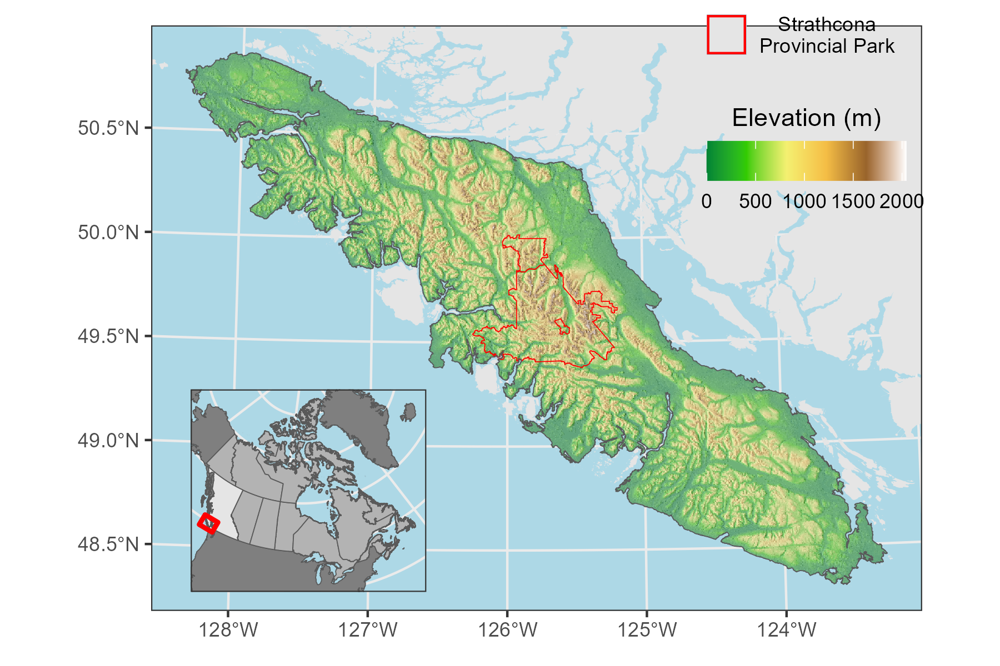

In [ ]:
knitr::include_graphics("E:/Sync/Masters/04_vi_pristine/figures/study_area.png")

## Data

### Forest Structure

We utilize four forest structural attributes; canopy height, canopy cover, structural complexity, and aboveground biomass. Canopy height, canopy cover, structural complexity are standardized lidar-derived metrics suitable for biodiversity monitoring at the ecosystem scale \[@valbuena2020\]. These are commonly used to assess patterns of structure in the vertical and horizontal directions within a single stand, rather than across a landscape, with these stand level metrics being linked to habitat, and thus, biodiversity \[@bergen2009; @macarthur1961; @gao2014\]. The fourth attribute, aboveground biomass, represents the key ecosystem service of carbon sequestration \[@naidoo2006; @duncanson2023\], and is likely moderated by the three lidar-derived variables \[@ali2019\].

These four forest structural attributes were generated in a wall-to-wall fashion at a 30 m spatial resolution by @matasci2018 for the year 2015 using a random forest-kNN approach, that imputes lidar-derived forest structural attributes across Canada’s forested ecosystems using Landsat-derived best-available-pixel (BAP) composites \[@white2014; @hermosilla2016\] and topographic information \[@matasci2018; @matasci2018a\]. The BAP composites were generated by selecting surface reflectance observations from the Landsat archive over the course of Canada’s growing season (August 1<sup>st</sup> ± 30 days), avoiding atmospheric effects including haze, clouds, and cloud shadows These composites were further refined by using a spectral trend analysis remove noise and infill data gaps \[@hermosilla2015\]. Accuracy metrics for the forest structural attributes ranged from an RMSE of 29.7% (structural complexity) to 65.8% (aboveground biomass) and R<sup>2</sup> values of 0.70 (aboveground biomass) to 0.13 (structural complexity).

### Forest Function

To represent forest ecosystem function, we use the Dynamic Habitat Indices (DHIs) dataset, a suite of intra-annual summaries of energy (as represented by a vegetation index or estimate of gross/net primary productivity) availability \[@radeloff2019\]. Single time points of energy availability have commonly been used as indicators of ecosystem functioning \[@pettorelli2005; @pettorelli2018\], and the DHIs advance upon these snapshots by generating yearly summaries of energy availability, thus more strongly linking these metrics to ecosystem functioning. The DHIs are composed of the total available energy over the course of a year (Cumulative DHI), the minimum amount of energy available over the course of a year (Minimum DHI), and the variation in energy available over the course of a year (Variation DHI). The DHIs have been shown to be indicative of ecosystem functioning, as they represent energy availability and seasonality \[@berry2007\], and biodiversity over a range of scales \[@radeloff2019; @razenkova2022\], extents \[@WOS:000265076300011; @coops2019\] and taxa \[@razenkovaMoose; @suttidateConn\].

We calculated the DHIs at a 30 m spatial resolution using Landsat data, following the methodology of @razenkova2023. The DHIs were computed on Google Earth Engine \[@gorelick2017\] by creating a synthetic year of monthly NDVI composites using all available Landsat imagery from 2011-2020 (centred on 2015). We used the Landsat QA band \[@zhu2012\] to filter pixels with clouds and cloud shadows. Monthly NDVI values were calculated by taking the median of each month’s NDVI observations, ignoring the year the image was acquired. This resulted in DHIs at 30 m spatial resolution \[@razenkova2023\]. The DHIs are calculated as the sum (Cumulative DHI), minimum (Minimum DHI), and coefficient of variation (Variation DHI) of these monthly observations. In this study, we focus on the Cumulative and Variation DHIs, as the minimum DHI is consistently 0 due to the presence of snow during winter in our study area.

### Anthropogenic Pressures

We used the Canadian Human Footprint as developed by @hirsh-pearson2022 to indicate anthropogenic pressures on the environment. The Canadian Human Footprint is an additive pressure map generated by summing the 12 different anthropogenic pressures (built environments, crop land, pasture land, population density, nighttime lights, railways, roads, navigable waterways, dams and associated reservoirs, mining activity, oil and gas, and forestry), which ranges from zero to 55 for any cell across Canada. This cumulative dataset is also distributed with Canada-wide individual pressure values \[@hirsh-pearson\]. We use the anthropogenic pressure layers to define our reference state by excluding pixels with any amount of anthropogenic pressure in Strathcona Park, and also assess the impact of anthropogenic pressures on ecological integrity. Here, we focus on the overall cumulative pressure map and four individual pressures: population density, built environments, roads, and forestry. We selected these four as other pressures (oil and gas; railroads) are not present on Vancouver Island, while pasture land and crop land do not coincide with currently forested areas. We reclassify the Canadian Human Footprint \[@hirsh-pearson; @hirsh-pearson2022\] into categorical data following @hirsh-pearson2022 and @arias-patino2024: a value of zero is considered intact, zero to four has low anthropogenic pressure, four to eight has medium anthropogenic pressure, and above eight has high anthropogenic pressure.

### Covariates

In order to ensure that we were identifying suitable reference states, we matched undisturbed forest areas within Strathcona Park with forested areas outside the park based on topographic and climatic features. We use a 30 m digital elevation model and derived slope dataset from the Advanced Spaceborne Thermal Emission and Reflection Radiometer (ASTER) Version 3 GDEM product \[@abrams2020\]. We also used four climate variables; mean annual precipitation (MAP), mean annual temperature (MAT), mean warmest month temperature (MWMT), and mean coldest month temperature (MCMT) calculated from 1990-2020 climate normals using the ClimateNA software package at a 1 km spatial resolution, and downsampled to 30 m using cubic spline resampling in the **terra** (version 1.7-71) R package \[@R-terra\] in R \[@R-base version 4.4.1\]. A visualization of one of each input dataset can be found in @fig-data.

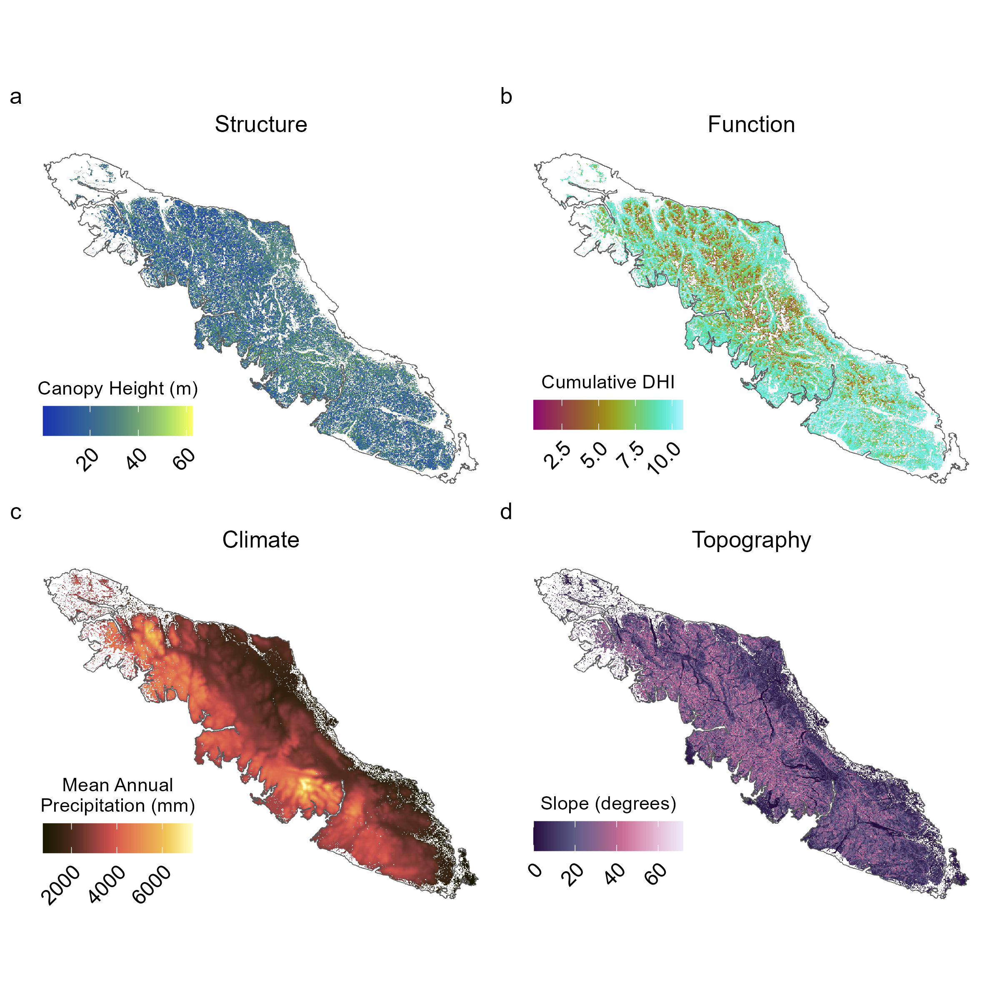

In [ ]:
knitr::include_graphics("E:/Sync/Masters/04_vi_pristine/figures/data_figure.png")

## Calculating Ecological Dissimilarity

We calculated the sigma dissimilarity \[@mahony2017\] of forested pixels across our study area by using an expanded coarsened exact matching (CEM) technique \[@iacus2012\] (@fig-flow) for each forest type (broadleaf, coniferous, mixed wood, and wetland-treed) \[@hermosilla2018\]. The CEM technique creates comparable groups of observations across covariates by initially coarsening the covariates. In this instance, all six covariates (elevation, slope, mean annual precipitation, mean annual temperature, mean coldest month temperature, and mean warmest month temperature) were coarsened into five quintiles, hereafter referred to as bins. CEM then performs exact matching on the bins, with each pixel matched to a climatically and topographically similar group of pixels within the reference state (i.e. Strathcona Park), hereafter referred to as stratum. If inusfficient numbers of matched pixels were found in the reference state, we calculated the stratum’s nearest neighbour across covariate bins, and sampled up to 100 pixels, while minimizing the nearest neighbour distance. If the average nearest neighbour distance was greater than two, that stratum was excluded from the analysis.

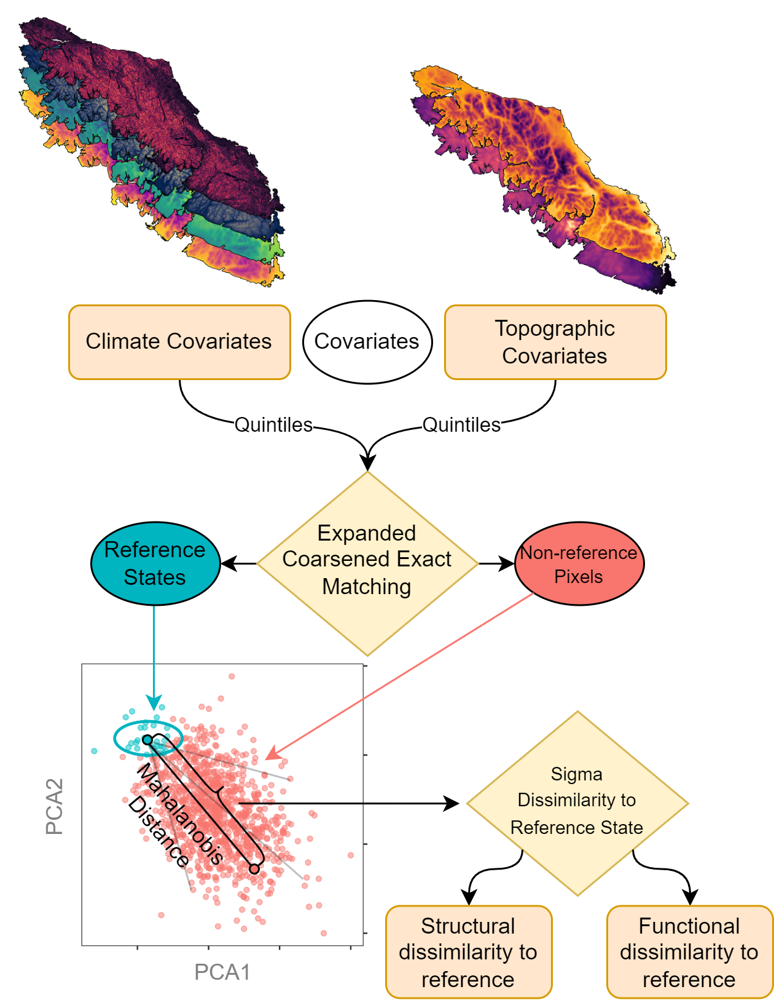

In [ ]:
knitr::include_graphics("E:/Sync/Masters/04_vi_pristine/figures/flow.drawio.png")

Following the matching procedure, we identified reference states as undisturbed (human footprint = 0; no fire or harvesting disturbance) \[@hirsh-pearson2022; @hermosilla2015\] pixels by stratum within Strathcona Park. We then determine the dissimilarity of all pixels, in structural, functional, and structural + functional attributes, to the reference states by calculating the sigma dissimilarity metric. Sigma dissimilarity standardizes the Mahalanobian distance \[@mahalanobis1936generalized\] by rescaling it into percentiles of the chi distribution to account for the effect of dimensionality when creating a multivariate dissimilarity metric \[@mahony2017\]. We calculated sigma dissimilarity for every stratum with a suitable reference state as generated by our matching procedure. This dissimilarity metric effectively functions as a multivariate proxy for ecological integrity, with higher values indicating a larger difference from near natural conditions found within the reference state.

## Impacts of anthropogenic pressure on ecological dissimilarity

To assess the cumulative impact of anthropogenic pressure on ecological dissimilarity, we implement stratified sampling on all suitable stratum, sampling 100 samples from each anthropogenic pressure class. For our individual pressures, we sampled an additional 100 samples for each pressure class. Sampling was performed using the **sgsR** (version 1.4.5) R package \[@goodbody2023\] with the Quiennec method \[@queinnec2021\]. Geospatial data processing was performed using the **terra** (version 1.7-78) \[@R-terra\], **sf** (version 1.0-16) \[@sf2018; @sf2023\], and **tidyterra** (version 0.6.1) \[@R-tidyterra\] R packages.

We used a one-way analysis of variance (ANOVA) with a critical p value of 0.05 to identify statistically significant differences in the mean similarity values across cumulative anthropogenic pressure classes. We account for family-wise error rate in our ANOVAs using the Holm-Bonferroni method \[@holm1979\], only continuing the analysis for similarity variables with significant ANOVAs at the adjusted critical value. We used a Tukey HSD post-hoc test to identify which means are different from the control group (intact pixels), which also controls for the family-wise error rate.

We follow the same protocol to identify the difference in means for each anthropogenic pressure of interest (roads, population density, forestry, and built environment). We compare each pressure to the same ‘no pressure’ values sampled in the cumulative pressure analysis. All statistical analysis were conducted using the **rstatix** (version 0.7.2) R package \[@R-rstatix\].

# Results

We generated maps of sigma dissimilarity for ecosystem structure, function, and structure + function across Vancouver Island as a measure of ecological integrity (@fig-regional). We show three representative examples within Vancouver Island to display the impact of anthropogenic pressures on ecosystem similarity, displaying a region near Lake Cowichan where harvesting is a common pressure (@fig-regional A), a protected area (Elk Falls Provincial Park) near Campbell River with high population density (@fig-regional B), and a region with lower anthropogenic pressures (@fig-regional C). Functional dissimilarity shows higher variation across all three sites than functional or structural and functional dissimilarity. The protected region near Campbell River (@fig-regional B) has lower dissimilarity metrics for all three metrics.

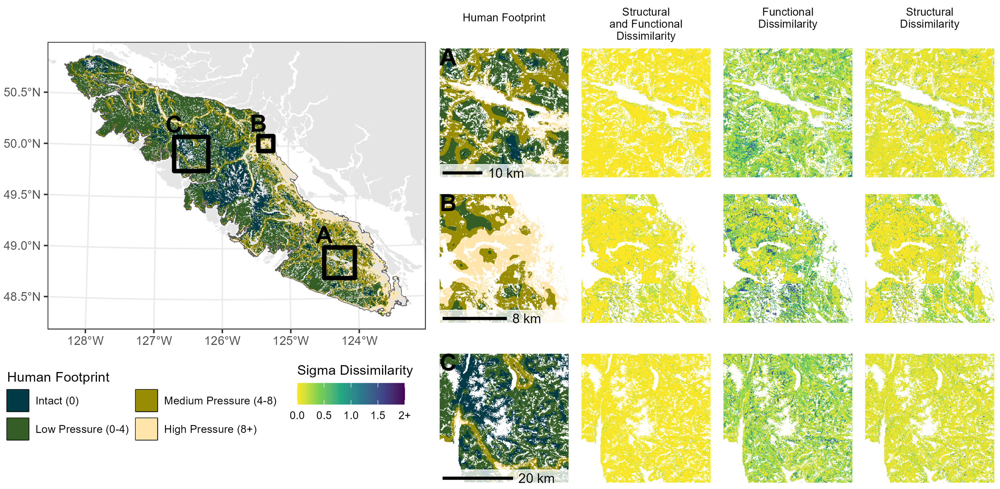

In [ ]:
knitr::include_graphics("E:/Sync/Masters/04_vi_pristine/figures/multi_panel_inset_wide_PS.png")

We used ANOVAs and post-hoc Tukey HSD tests to assess the influence of the cumulative human footprint on ecological dissimilarity (@fig-boxplot-overall) . Results indicate that structural (ANOVA; p = 0.014) and structural + functional (ANOVA; p = 0.006) dissimilarity was significantly different under varying anthropogenic pressures. The functional dissimilarity metric did not significantly vary with anthropogenic pressures. The Tukey HSD test revealed that high levels of anthropogenic pressures significantly influence dissimilarity to the structural (ANOVA; p \< 0.01) and structural + functional (ANOVA; p \< 0.05) reference state. Medium and low levels of anthropogenic pressures did not significantly influence any dissimilarity metrics.

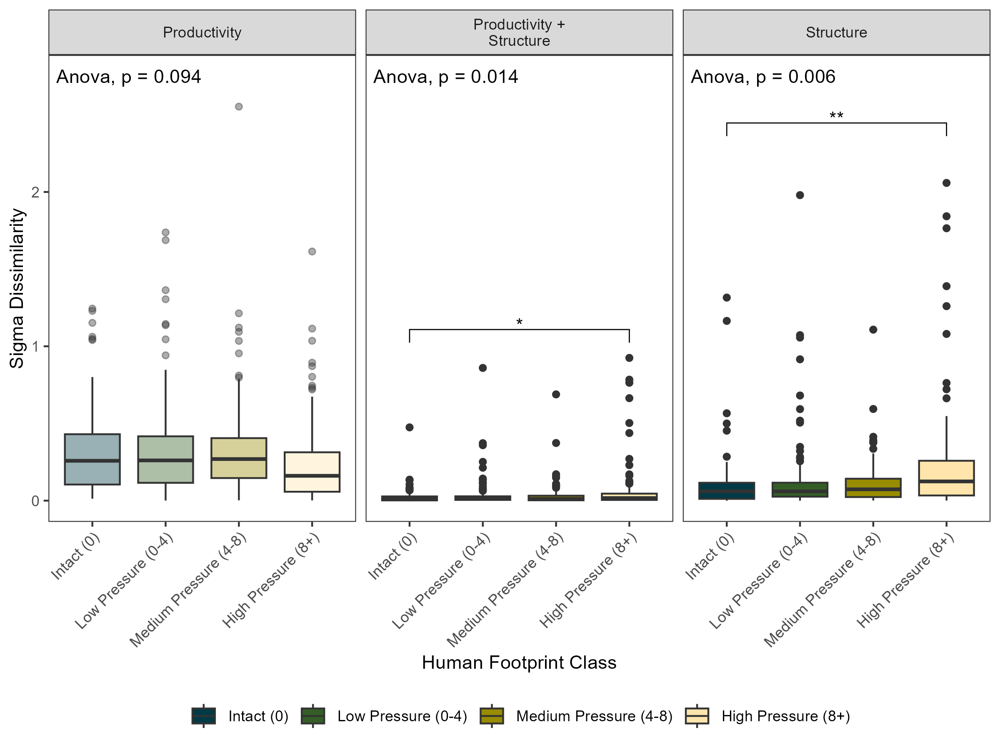

In [ ]:
knitr::include_graphics("E:/Sync/Masters/04_vi_pristine/figures/mahal_boxplot_sig.png")

Further we assessed the impact of individual pressures on ecological dissimilarity to the reference state (@fig-boxplot-individual). We found that functional dissimilarity was not significantly influenced by any anthropogenic pressures, and that roads did not influence any type of ecological dissimilarity (ANOVAs; all p \> 0.05). Population density, forestry and harvesting, and built environments did significantly increase both structural and structural + functional dissimilarity (ANOVAs; all p \< 0.01). Only the highest levels of pressures for each anthropogenic pressure category significantly influenced ecological dissimilarity (ANOVAs; all p \< 0.01).

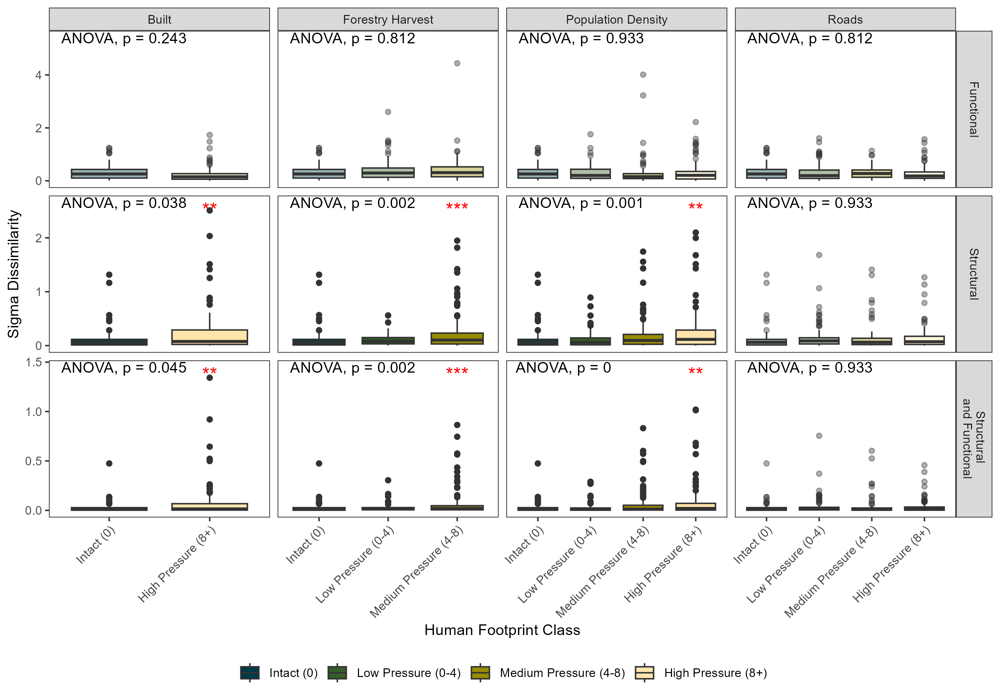

In [ ]:
knitr::include_graphics("E:/Sync/Masters/04_vi_pristine/figures/indiv_boxplots.png")

# Discussion

Here, we propose a novel approach to assess ecological integrity across forested ecosystems. Our method incorporates an expanded coarsened exact matching technique \[@iacus2012\] and a multidimensional dissimilarity metric \[@mahony2017\]. This method integrates a robust method for generating suitable reference states through the use of a large, long-term protected area, and excluding any pressures and disturbances, and estimates ecological integrity as dissimilarity to the reference state by using the sigma dissimilarity metric, which accounts for covariations in the data and varying dimensionality in input datasets. The methodology is demonstrated on the forested areas of Vancouver Island, which are environmentally similar to the reference state, Strathcona Park. Furthermore, the influence of anthropogenic pressure on ecological integrity is assessed. It was found that high levels of anthropogenic pressure increase structural and structural + functional dissimilarity, thus showing a reduction in ecological integrity (@fig-boxplot-overall; @fig-boxplot-individual). However, functional dissimilarity was never influenced by anthropogenic pressures.

Our structural dissimilarity metric is similar to other metrics of forest condition, such as the forest structural condition index \[@hansen2019\], however, it is not reliant on expert-set thresholds. This potentially allows our metric to be transferable to new ecosystems and environments, even allowing for the assessment of dissimilarity for other ecosystems or a species’ core ranges by changing the reference state. This could be important for conservation efforts of rare and threatened species. Further, we found that high cumulative anthropogenic pressures increases structural dissimilarity (@fig-boxplot-overall), and that high individual pressures, except roads, also increase structural dissimilarty (@fig-boxplot-individual). Prior research has generally focused on tropical forests, where @bourgoin2024 found that anthropogenic forest degradation influenced aboveground biomass and canopy height, however, they focus on edge effects, fire, and selective logging, rather than cumulative and individual anthropogenic pressures. @li2023 also found a global impact of anthropogenic pressures on forest structural density; however, they do not explore which facets of anthropogenic pressure are the strongest driver of forest degradation. @hansen2020 integrate forest structure and anthropogenic pressure into the forest structural integrity index to identify forest stands of high ecological value (high structural quality; low anthropogenic footprint). We further this body of research by assessing individual pressures on a multivariate metric of structural similarity to a high-quality reference state (@fig-boxplot-individual). While we assess impacts of pressures on structural dissimilarity, integrating them together, similar to @hansen2020, could help with protected area prioritization efforts outside of moist tropical forests.

We also assess functional dissimilarity to high-integrity forests. We found that functional dissimilarity more strongly varies than structural dissimilarity (@fig-regional). However, we did not find any significant influence of cumulative or individual anthropogenic pressures on our forest functioning metrics (@fig-boxplot-overall; @fig-boxplot-individual). This may in part be due to the DHIs reliance on vegetation indices or productivity estimates, in our case NDVI. Vegetation indices have been shown to saturate at high levels of canopy cover and leaf area index \[@huete1997; @huete2002\], which are common in our study area. Recent research has shown that seasonality, here represented as the Variation DHI, drives functional diversity in avian assemblages, however, these results also strongly varied by region \[@keyser2024\]. It is possible that examining anthropogenic pressure impacts in regions with more variation in canopy cover and stronger seasonality may lead to differing results, as Vancouver Island has a moderate climate, and is primarily dominated by conifer species \[@sec-study\].

We identified high-integrity forest reference states across a large region using a data-driven approach. Often, it is common for suitable reference states to be unavailable due to a lack of data on regions of high ecological integrity, especially across large regions \[@mcnellie2020\]. We attempt to circumvent this by using a large, long-established protected area (Strathcona Provincial Park; @fig-study), and a matching technique that preserves environmental similarity between reference states and their counterparts. The long-established, large protected area ensures that little anthropogenic pressures or modification have been made to the landscape, while also guaranteeing that the reference state is attainable for a given topography and climate \[@hobbs2014; @corlett2016\] due to contemporary nature of the reference state. Our matching technique (coarsened exact matching, combined with a nearest neighbour approach when no exact match is available) allows us to generate reference states in a near wall-to-wall fashion, which ensures environmental consistency between reference state and compared pixels.

Our techniques move beyond traditional impact evaluation techniques \[@ferraro2009\] commonly used in protected area effectiveness assessments by generating spatially explicit maps of ecological dissimilarity, and generating a multivariate, rather than univariate, assessment of similarity to high ecological integrity forests. While our methods use a data-driven approach to derive reference states using a high-quality protected area, the method is inherently reference state agnostic. Dissimilarity metrics could be generated for a specific ecosystem, species, or community at landscape scales, identifying areas with similar structural and functional conditions. This could be especially relevant for species with known habitat requirements, such as the marbled murrelet (*Brachyramphus marmoratus*) needing tall, complex forests as nesting habitat \[@cosgrove2024\]

Assessing individual pressure influences on the environment is also relevant to questions of how cumulative anthropogenic pressure maps are calculated. There is an ongoing debate surrounding anthropogenic pressure mapping methods, as there is little information on mechanistic interactions between pressures \[@arias-patino2024\]. We assess individual pressures on ecological dissimilarity in forests across Vancouver Island, Canada, an advancement upon the current standard of using a single value of cumulative anthropogenic pressure \[@li2023; @bourgoin2024\]. Similar methods could be used to examine mechanistic pressure interactions across large scales by examining combinations of pressures rather than individual or overall impacts.

# Conclusion

Identifying the location of high-integrity forests is integral to conservation efforts, especially when considering protected area management \[@pillay2024; @hansen2021\]. Until recently, area based conservation has dominated management strategies, which does not ensure that high-integrity ecosystems, typically having high biodiversity and ecosystem services present, are protected \[@pillay2024; @ferrier2024\]. Recent efforts to identify high-integrity forests have been primarily focused on moist tropical forests \[@hansen2019\], which contain large numbers of threatened species reliant on intact forest structures \[@pillay2024a\]. Due to their focus on moist tropical forests, their methodology cannot easily be transferred to other forested ecosystems, particularly due to their focus on tall, complex trees \[@hansen2019\] without considering local environmental conditions. Here, we use matching techniques to circumvent this, and use sigma dissimilarity to consider additional structural and functional information, allowing us to identify high-integrity forests without relying on expert defined thresholds which may not be suitable or available in all biomes. This advance can be used to conservation planning strategies, as we work towards the 30x30 goal outlined in the GBF \[@reporto2023\].

# Acknowledgements

This research was funded by NSERC support of Coops (RGPIN-2024-04402). Remote sensing data products used in this research are free and open and available for download at <https://ca.nfis.org/maps_eng.html>. The authors thank Dr. Michael A. Wulder and Dr. Joanne C. White for development and early access to these National Terrestrial Ecosystem Mapping System (NTEMS) products. They thank Dr. Elena Razenkova for early access to the Landsat-derived Dynamic Habitat Indices. ERM would like to thank the members of the IRSS for many helpful conversations throughout the preparation of this manuscript.

# Ethics

The authors declare no conflicts of interest.

# References